# Install all of the depedency

In [1]:
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4305, done.
remote: Counting objects: 100% (4305/4305), done.
remote: Compressing objects: 100% (3315/3315), done.
remote: Total 4305 (delta 1212), reused 2205 (delta 917), pack-reused 0 (from 0)
Receiving objects: 100% (4305/4305), 53.16 MiB | 11.50 MiB/s, done.
Resolving deltas: 100% (1212/1212), done.
Updating files: 100% (3875/3875), done.


In [2]:
# For compatibility. Pin tf-models-official version so it will use Tensorflow 2.15.
!sed -i 's/tf-models-official>=2.5.1/tf-models-official==2.15.0/g' ./models/research/object_detection/packages/tf2/setup.py

In [3]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 9.9 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.0/152.0 kB 15.7 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.5/43.5 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparin

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2024.10.0 requires cloudpickle>=3.0.0, but you have cloudpickle 2.2.1 which is incompatible.


In [4]:
!pip install protobuf==3.20.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.0 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.25.5
    Uninstalling protobuf-4.25.5:
      Successfully uninstalled protobuf-4.25.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
apache-beam 2.61.0 requires protobuf!=4.0.*,!=4.21.*,!=4.22.0,!=4.23.*,!=4.24.*,<6.0.0.dev0,>=3.20.3, but you have protobuf 3.20.0 which is incompatible.
google-ai-generativelanguage 0.6.10 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<6.0.0dev,>=3.20.2, but you have protobuf 3.20.0 which is incompatible.
google-api-core 2.19.2 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<6.0.0.dev0,>=3.19.5, but you have protobuf 3.20.0 which is incompatible.
google-cloud-aiplatform 1.73.0 requires protobuf!=4.21.0,!=4.21.1,

In [5]:
!pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.2 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.1 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.20.3, but you have protobuf 3.20.0 which is incompatible.


In [6]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import os
import random
import io
import imageio
import pandas as pd
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder

%matplotlib inline

# Load dataset from roboflow

In [7]:
from roboflow import Roboflow
rf = Roboflow(api_key="wo0ILZ2EdiUJKy9Ae5bx")
project = rf.workspace("tes-m14gd").project("capstone-foodlabel-ypujk")
version = project.version(2)
dataset = version.download("tensorflow")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to capstone-foodlabel-2 in tensorflow:: 100%|██████████| 250/250 [00:00<00:00, 6091.91it/s]


In [38]:
def load_image_into_numpy_array(path):
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):

  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.8)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)


# Load images and normalize ground truth


In [9]:
train_image_dir = '/content/capstone-foodlabel-2/train/'

annotations_df = pd.read_csv(os.path.join(train_image_dir, '_annotations.csv'))

train_images_np = []
gt_boxes = []

for index, row in annotations_df.iterrows():
    image_path = os.path.join(train_image_dir, row['filename'])
    image_np = load_image_into_numpy_array(image_path)
    train_images_np.append(image_np)

    image_height, image_width, _ = image_np.shape

    # Extract and normalize bounding box coordinates
    box = np.array([[row['ymin'] / image_height,
                     row['xmin'] / image_width,
                     row['ymax'] / image_height,
                     row['xmax'] / image_width]], dtype=np.float32)
    gt_boxes.append(box)

# for gt_box in gt_boxes:
#   print(gt_box)

# Prepare data for training

In [10]:
label_class_id = 1
num_classes = 1

category_index = {label_class_id:{
    'id'  : label_class_id,
    'name': 'nutrition-label'
}}
print(category_index[label_class_id])

label_id_offset = 1
train_image_tensors = []
gt_classes_one_hot_tensors = []
gt_box_tensors = []
for (train_image_np, gt_box_np) in zip(
    train_images_np, gt_boxes):
  train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(
      train_image_np, dtype=tf.float32), axis=0))
  gt_box_tensors.append(tf.convert_to_tensor(gt_box_np, dtype=tf.float32))
  zero_indexed_groundtruth_classes = tf.convert_to_tensor(
      np.ones(shape=[gt_box_np.shape[0]], dtype=np.int32) - label_id_offset)
  gt_classes_one_hot_tensors.append(tf.one_hot(
      zero_indexed_groundtruth_classes, num_classes))
print('Done prepping data.')

{'id': 1, 'name': 'nutrition-label'}
Done prepping data.


# Visualize images with ground truth.

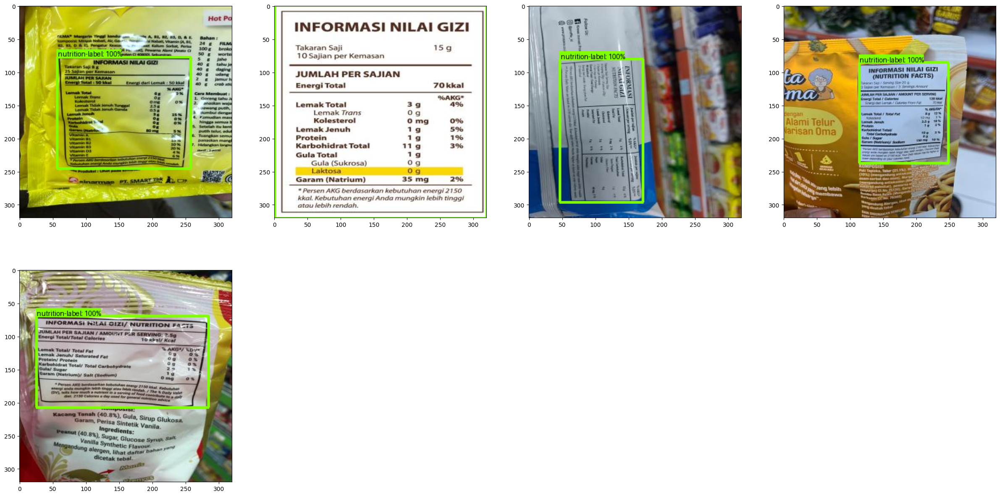

In [11]:
dummy_scores = np.array([1.0], dtype=np.float32)  # give boxes a score of 100%

plt.figure(figsize=(30, 15))
for idx in range(5):
  plt.subplot(2, 4, idx+1)
  plot_detections(
      train_images_np[idx],
      gt_boxes[idx],
      np.ones(shape=[gt_boxes[idx].shape[0]], dtype=np.int32),
      dummy_scores, category_index)
plt.show()

# Download the checkpoint containing the pre-trained weight


*   We are going to use SSD-MobileNet-V2-320x320 because it is compatible to mobile devices
*   We are going to get the pretrained weights like the feature extractor and box.predictor



In [12]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
!tar -xf ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
!if [ -d "models/research/object_detection/test_data/checkpoint" ]; then rm -Rf models/research/object_detection/test_data/checkpoint; fi
!mkdir models/research/object_detection/test_data/checkpoint
!mv ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint models/research/object_detection/test_data/

--2024-12-09 10:02:51--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.251.2.207, 142.250.101.207, 2607:f8b0:4023:c0d::cf, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|142.251.2.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M   112MB/s    in 0.2s    

2024-12-09 10:02:51 (112 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]



# Configure the model

In [13]:
tf.keras.backend.clear_session()

# Define the path to the .config file for ssd mobilenet v2 320x320
pipeline_config = 'models/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config'
checkpoint_path = 'models/research/object_detection/test_data/checkpoint/ckpt-0'

# This will be where we save checkpoint & config for TFLite conversion later.
output_directory = 'output/'
output_checkpoint_dir = os.path.join(output_directory, 'checkpoint')

# Load the configuration file into a dictionary
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
configs

{'model': ssd {
   num_classes: 90
   image_resizer {
     fixed_shape_resizer {
       height: 320
       width: 320
     }
   }
   feature_extractor {
     type: "ssd_mobilenet_v2_fpn_keras"
     depth_multiplier: 1.0
     min_depth: 16
     conv_hyperparams {
       regularizer {
         l2_regularizer {
           weight: 3.9999998989515007e-05
         }
       }
       initializer {
         random_normal_initializer {
           mean: 0.0
           stddev: 0.009999999776482582
         }
       }
       activation: RELU_6
       batch_norm {
         decay: 0.996999979019165
         scale: true
         epsilon: 0.0010000000474974513
       }
     }
     use_depthwise: true
     override_base_feature_extractor_hyperparams: true
     fpn {
       min_level: 3
       max_level: 7
       additional_layer_depth: 128
     }
   }
   box_coder {
     faster_rcnn_box_coder {
       y_scale: 10.0
       x_scale: 10.0
       height_scale: 5.0
       width_scale: 5.0
     }
   }
   matc

In [14]:
model_config = configs['model']
model_config

ssd {
  num_classes: 90
  image_resizer {
    fixed_shape_resizer {
      height: 320
      width: 320
    }
  }
  feature_extractor {
    type: "ssd_mobilenet_v2_fpn_keras"
    depth_multiplier: 1.0
    min_depth: 16
    conv_hyperparams {
      regularizer {
        l2_regularizer {
          weight: 3.9999998989515007e-05
        }
      }
      initializer {
        random_normal_initializer {
          mean: 0.0
          stddev: 0.009999999776482582
        }
      }
      activation: RELU_6
      batch_norm {
        decay: 0.996999979019165
        scale: true
        epsilon: 0.0010000000474974513
      }
    }
    use_depthwise: true
    override_base_feature_extractor_hyperparams: true
    fpn {
      min_level: 3
      max_level: 7
      additional_layer_depth: 128
    }
  }
  box_coder {
    faster_rcnn_box_coder {
      y_scale: 10.0
      x_scale: 10.0
      height_scale: 5.0
      width_scale: 5.0
    }
  }
  matcher {
    argmax_matcher {
      matched_threshold: 0.5
 

In [15]:
model_config.ssd.num_classes=num_classes
model_config.ssd.freeze_batchnorm = True
detection_model = model_builder.build(
      model_config=model_config, is_training=True)
model_config

ssd {
  num_classes: 1
  image_resizer {
    fixed_shape_resizer {
      height: 320
      width: 320
    }
  }
  feature_extractor {
    type: "ssd_mobilenet_v2_fpn_keras"
    depth_multiplier: 1.0
    min_depth: 16
    conv_hyperparams {
      regularizer {
        l2_regularizer {
          weight: 3.9999998989515007e-05
        }
      }
      initializer {
        random_normal_initializer {
          mean: 0.0
          stddev: 0.009999999776482582
        }
      }
      activation: RELU_6
      batch_norm {
        decay: 0.996999979019165
        scale: true
        epsilon: 0.0010000000474974513
      }
    }
    use_depthwise: true
    override_base_feature_extractor_hyperparams: true
    fpn {
      min_level: 3
      max_level: 7
      additional_layer_depth: 128
    }
  }
  box_coder {
    faster_rcnn_box_coder {
      y_scale: 10.0
      x_scale: 10.0
      height_scale: 5.0
      width_scale: 5.0
    }
  }
  matcher {
    argmax_matcher {
      matched_threshold: 0.5
  

In [16]:
pipeline_proto = config_util.create_pipeline_proto_from_configs(configs)
config_util.save_pipeline_config(pipeline_proto, output_directory)

# As we want to train the classification head from scratch therefore

In [17]:
fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    # _prediction_heads=detection_model._box_predictor._prediction_heads,
    #    (i.e., the classification head that we *will not* restore)
    _box_prediction_head=detection_model._box_predictor._box_prediction_head,
    )

In [18]:
fake_model = tf.compat.v2.train.Checkpoint(
          _feature_extractor=detection_model._feature_extractor,
          _box_predictor=fake_box_predictor)
ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(checkpoint_path).expect_partial()

# For TFLite conversion

In [19]:
exported_ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt_manager = tf.train.CheckpointManager(
    exported_ckpt, output_checkpoint_dir, max_to_keep=1)


# Initialize the weight

In [20]:
image, shapes = detection_model.preprocess(tf.zeros([1, 320, 320, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)
print('Weights restored!')

Weights restored!


# Finetuning

In [21]:
tf.keras.backend.set_learning_phase(True)

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


In [22]:
# Set hyperparameter
batch_size = 32
learning_rate = 0.1
num_batches = 30000

In [23]:
# Selects layers for fine-tuning from the model's trainable variables.
trainable_variables = detection_model.trainable_variables
to_fine_tune = []
prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']
for var in trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    to_fine_tune.append(var)

In [24]:
# Set up forward + backward pass for a single train step.
def get_model_train_step_function(model, optimizer, vars_to_fine_tune):

  @tf.function
  def train_step_fn(image_tensors,
                    groundtruth_boxes_list,
                    groundtruth_classes_list):

    shapes = tf.constant(batch_size * [[320, 320, 3]], dtype=tf.int32)
    model.provide_groundtruth(
        groundtruth_boxes_list=groundtruth_boxes_list,
        groundtruth_classes_list=groundtruth_classes_list)
    with tf.GradientTape() as tape:
      preprocessed_images = tf.concat(
          [detection_model.preprocess(image_tensor)[0]
           for image_tensor in image_tensors], axis=0)
      prediction_dict = model.predict(preprocessed_images, shapes)
      losses_dict = model.loss(prediction_dict, shapes)
      total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(total_loss, vars_to_fine_tune)
      optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))
    return total_loss

  return train_step_fn

In [25]:
# Set optimizer
optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
train_step_fn = get_model_train_step_function(detection_model, optimizer, to_fine_tune)

In [26]:
log_dir = "logs/fine_tuning"
os.makedirs(log_dir, exist_ok=True)

In [27]:
# Train the model
summary_writer = tf.summary.create_file_writer(log_dir)

print('Start fine-tuning!', flush=True)
for idx in range(num_batches):

    all_keys = list(range(len(train_images_np)))
    random.shuffle(all_keys)
    example_keys = all_keys[:batch_size]

    gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
    gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
    image_tensors = [train_image_tensors[key] for key in example_keys]

    # Training step (forward pass + backwards pass)
    total_loss = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)

    # Log loss to TensorBoard
    with summary_writer.as_default():
        tf.summary.scalar('loss', total_loss, step=idx)

    if idx % 100 == 0:
        print('batch ' + str(idx) + ' of ' + str(num_batches)
              + ', loss=' + str(total_loss.numpy()), flush=True)

print('Done fine-tuning!')

ckpt_manager.save()
print('Checkpoint saved!')


Start fine-tuning!
batch 0 of 30000, loss=1.5714369
batch 100 of 30000, loss=0.46895975
batch 200 of 30000, loss=0.3497104
batch 300 of 30000, loss=0.45487145
batch 400 of 30000, loss=0.39019093
batch 500 of 30000, loss=0.3080738
batch 600 of 30000, loss=0.28047425
batch 700 of 30000, loss=0.31644452
batch 800 of 30000, loss=0.30828282
batch 900 of 30000, loss=0.32569513
batch 1000 of 30000, loss=0.32846263
batch 1100 of 30000, loss=0.30325016
batch 1200 of 30000, loss=0.31645945
batch 1300 of 30000, loss=0.25536615
batch 1400 of 30000, loss=0.24863751
batch 1500 of 30000, loss=0.30919763
batch 1600 of 30000, loss=0.23435895
batch 1700 of 30000, loss=0.21954256
batch 1800 of 30000, loss=0.2157926
batch 1900 of 30000, loss=0.25854665
batch 2000 of 30000, loss=0.21869087
batch 2100 of 30000, loss=0.21662071
batch 2200 of 30000, loss=0.26651186
batch 2300 of 30000, loss=0.22093327
batch 2400 of 30000, loss=0.26958704
batch 2500 of 30000, loss=0.2615604
batch 2600 of 30000, loss=0.21910076

In [28]:
# Install TensorBoard Colab extension to visualize loss
%load_ext tensorboard
%tensorboard --logdir logs/fine_tuning


<IPython.core.display.Javascript object>

# Test finetuned model

In [29]:
# Load test images
test_image_dir = '/content/capstone-foodlabel-2/test/'
test_images_np = []

image_paths = glob.glob(os.path.join(test_image_dir, '*.jpg'))

for image_path in image_paths:
    # print(image_path)
    test_images_np.append(np.expand_dims(
        load_image_into_numpy_array(image_path), axis=0))

print(f"Loaded {len(test_images_np)} images.")

Loaded 74 images.


# Preprocess, predict, and post process an image

In [30]:
@tf.function
def detect(input_tensor):
    preprocessed_image, shapes = detection_model.preprocess(input_tensor)
    prediction_dict = detection_model.predict(preprocessed_image, shapes)
    detections = detection_model.postprocess(prediction_dict, shapes)

    return detections

# Visualize the prediction result

In [32]:
!mkdir gif_dir

In [33]:
label_id_offset = 1
results = {'boxes': [], 'scores': []}

for i in range(len(test_images_np)):
    input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
    detections = detect(input_tensor)
    # print(detections)
    plot_detections(
      test_images_np[i][0],
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.uint32)
      + label_id_offset,
      detections['detection_scores'][0].numpy(),
      category_index, figsize=(15, 20), image_name="/content/gif_dir/" + ('%03d' % i) + ".jpg")
    results['boxes'].append(detections['detection_boxes'][0][0].numpy())
    results['scores'].append(detections['detection_scores'][0][0].numpy())

In [34]:
# TEST CODE
print(len(results['boxes']))
print(results['boxes'][0].shape)
print()


74
(4,)



In [65]:
x = np.array(results['scores'])

# Percent of frames where a nutrition label is detected
label_detected = (np.where(x > 0.8, 1, 0).sum())/237*100
print(label_detected)

18.9873417721519


Frame 1


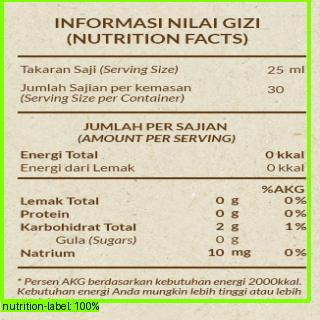


Frame 2


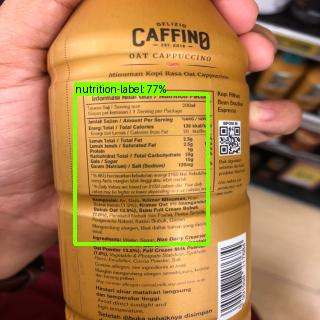


Frame 3


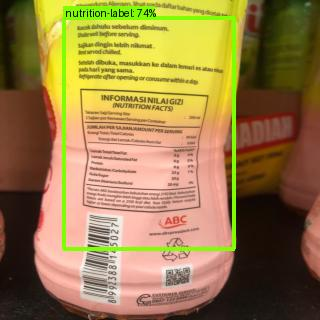

In [61]:
print('Frame 1')
display(IPyImage('/content/gif_dir/000.jpg'))
print()
print('Frame 2')
display(IPyImage('/content/gif_dir/017.jpg'))
print()
print('Frame 3')
display(IPyImage('/content/gif_dir/022.jpg'))

# Convert to TFLite Model

In [ ]:
!ls

capstone-foodlabel-2  logs    output	   ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8
gif_dir		      models  sample_data  ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz


In [ ]:
# %%bash
!python models/research/object_detection/export_tflite_graph_tf2.py \
  --pipeline_config_path output/pipeline.config \
  --trained_checkpoint_dir output/checkpoint \
  --output_directory tflite

2024-12-09 09:53:23.277724: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-09 09:53:23.277783: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-09 09:53:23.279451: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-09 09:53:24.686998: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-09 09:53:28.150227: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I1209 09:53:31.414507 136

In [ ]:
_TFLITE_MODEL_PATH = "tflite/model.tflite"

converter = tf.lite.TFLiteConverter.from_saved_model('tflite/saved_model')
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_model = converter.convert()

with open(_TFLITE_MODEL_PATH, 'wb') as f:
  f.write(tflite_model)

In [ ]:
with open('labels.txt', 'w') as f:
  f.write('nutrition-label')

In [ ]:
!pip install -q tflite-support
!pip install -q tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 5.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tflite-support 0.4.4 requires protobuf<4,>=3.18.0, but you have protobuf 4.25.5 which is incompatible.


In [ ]:
from tflite_support.metadata_writers import object_detector
from tflite_support.metadata_writers import writer_utils

_TFLITE_MODEL_WITH_METADATA_PATH = "tflite/model_with_metadata.tflite"

writer = object_detector.MetadataWriter.create_for_inference(
    writer_utils.load_file(_TFLITE_MODEL_PATH), input_norm_mean=[127.5],
    input_norm_std=[127.5], label_file_paths=["labels.txt"])
writer_utils.save_file(writer.populate(), _TFLITE_MODEL_WITH_METADATA_PATH)

In [ ]:
from google.colab import files
files.download('tflite/model_with_metadata.tflite')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>